In [1]:
from glob import glob
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.colors import TwoSlopeNorm
import matplotlib as mpl
import gseapy as gp

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/celltypes_max/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
paths = glob('/stanley/WangLab/kamal/data/technologies/xenium/mouse_ad/filtered/*juxtacrine_dual.h5ad')
adatas = [sc.read_h5ad(path) for path in paths]

In [4]:
adatas

[AnnData object with n_obs × n_vars = 60829 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 59889 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 58681 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 58230 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 58684 × 347
     obs: 'condition', 'age', 'sample', 'n_counts'
     uns: 'condition_colors', 'log1p', 'sample_colors'
     obs

In [5]:
adatas[0].X.max()

5.204006687076795

In [6]:
adatas[0].X.min()

0.0

In [7]:
filter_key = 'celltyping'
max_mag = 2

for i in range(len(adatas)):

    # Add layer for non-filtered data
    adatas[i].layers[filter_key] = adatas[i].X

    # Scale
    sc.pp.scale(adatas[i], layer=filter_key)

    # # Clip
    # X = adatas[i].layers[filter_key]
    # X[X > max_mag] = max_mag
    # X[X < -max_mag] = -max_mag

adata = sc.concat(adatas)

/home/unix/kmaher/.local/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 15
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))
figsize=(set_width, height*fignorm)

# Clustering

In [9]:
n_pcs = 10
pca = PCA(n_components=n_pcs, random_state=0)
adata.obsm[f'X_pca_{filter_key}'] = pca.fit_transform(adata.layers[filter_key])
adata.varm[f'X_pca_{filter_key}'] = pca.components_.T

In [10]:
# n_celltypes = 8
# kmeans = KMeans(n_clusters=n_celltypes, random_state=0)
# kmeans.fit(adata.obsm[f'X_pca_{filter_key}'])
# adata.obs['celltype'] = kmeans.labels_.astype(str)

In [11]:
sc.pp.neighbors(adata, use_rep=f'X_pca_{filter_key}')

/stanley/WangLab/kamal/envs/xax/lib/python3.9/site-packages/scipy/sparse/_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


In [12]:
sc.tl.leiden(adata, resolution=0.09, key_added='celltype', flavor='igraph', n_iterations=2)

## Plot markers

In [13]:
sc.tl.rank_genes_groups(adata, groupby='celltype', layer=filter_key)
sc.tl.dendrogram(adata, groupby='celltype', use_rep=f'X_pca_{filter_key}')

/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmah

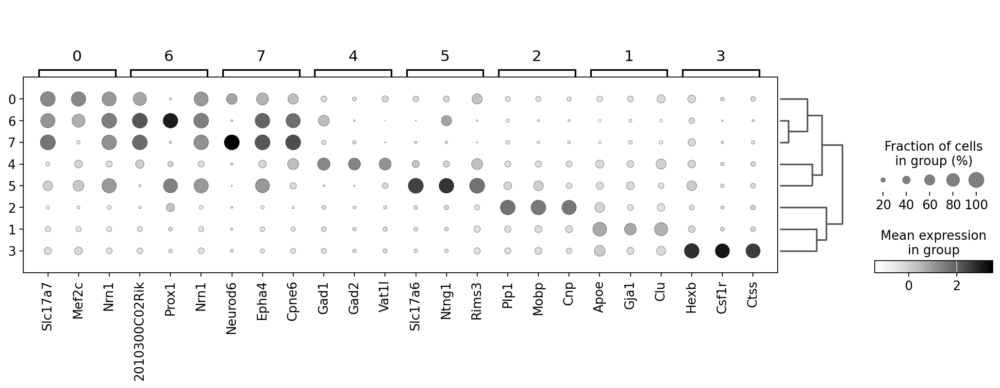

In [14]:
fig = plt.figure(figsize=(16,4.5))
ax = plt.gca()
sc.pl.rank_genes_groups_dotplot(adata, groupby='celltype', n_genes=3, layer=filter_key, ax=ax, cmap='Greys')
figname = 'celltype_markers.png'
savepath = os.path.join(figpath, figname)
fig.savefig(savepath, dpi=dpi, bbox_inches='tight')

## Plot tissue

In [19]:
palette = sc.pl.palettes.default_102

celltype2color = {
    '0': palette[0], # Neuron
    '1': palette[4], # Astro
    '2': palette[1], # Oligo
    '3': palette[3], # Micro
    '4': palette[5], # Neuron
    '5': palette[7], # Neuron
    '6': palette[2], # Neuron
    '7': palette[6], # Neuron
}

adata.obs['celltype_colors'] = adata.obs['celltype'].map(celltype2color)

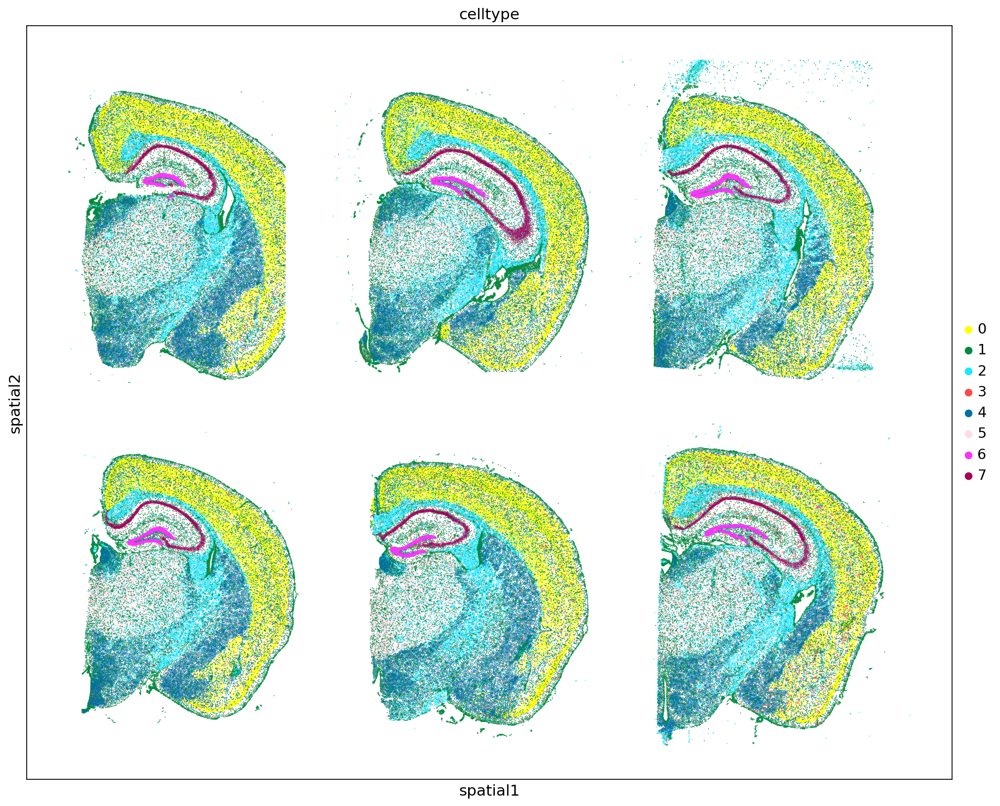

In [20]:
sc.pl.embedding(
    adata,
    basis='spatial',
    color='celltype',
    palette=celltype2color,
    s=3,
)

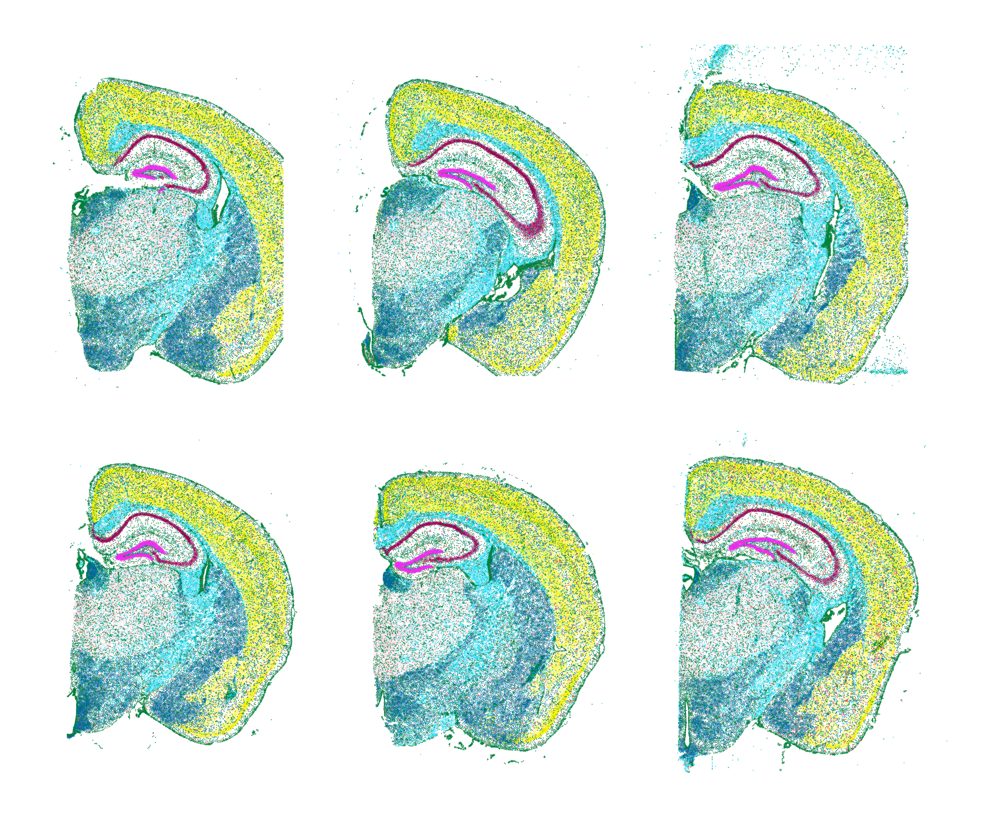

In [21]:
points = adata.obsm['spatial']
plt.figure(figsize=figsize)
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=0.6,
    c=adata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Zoom

In [22]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/10
zoom_height = zoom_width

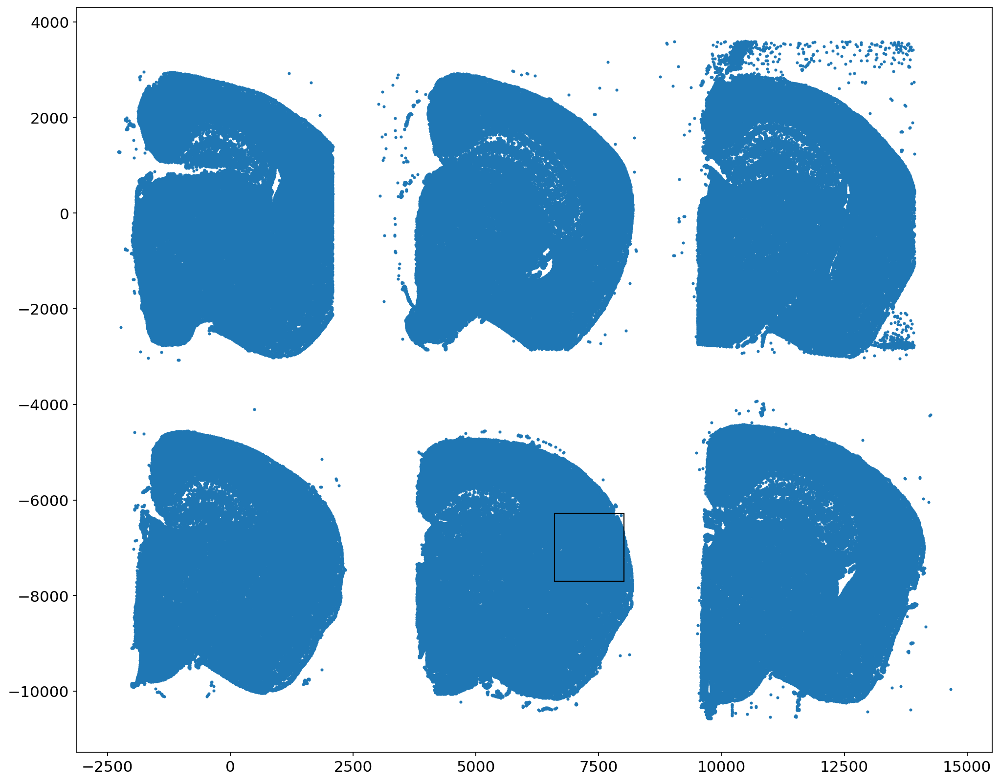

In [23]:
# /8
zoom_x = 6600
zoom_y = -7700

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 10000
# zoom_y = -7000

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [24]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

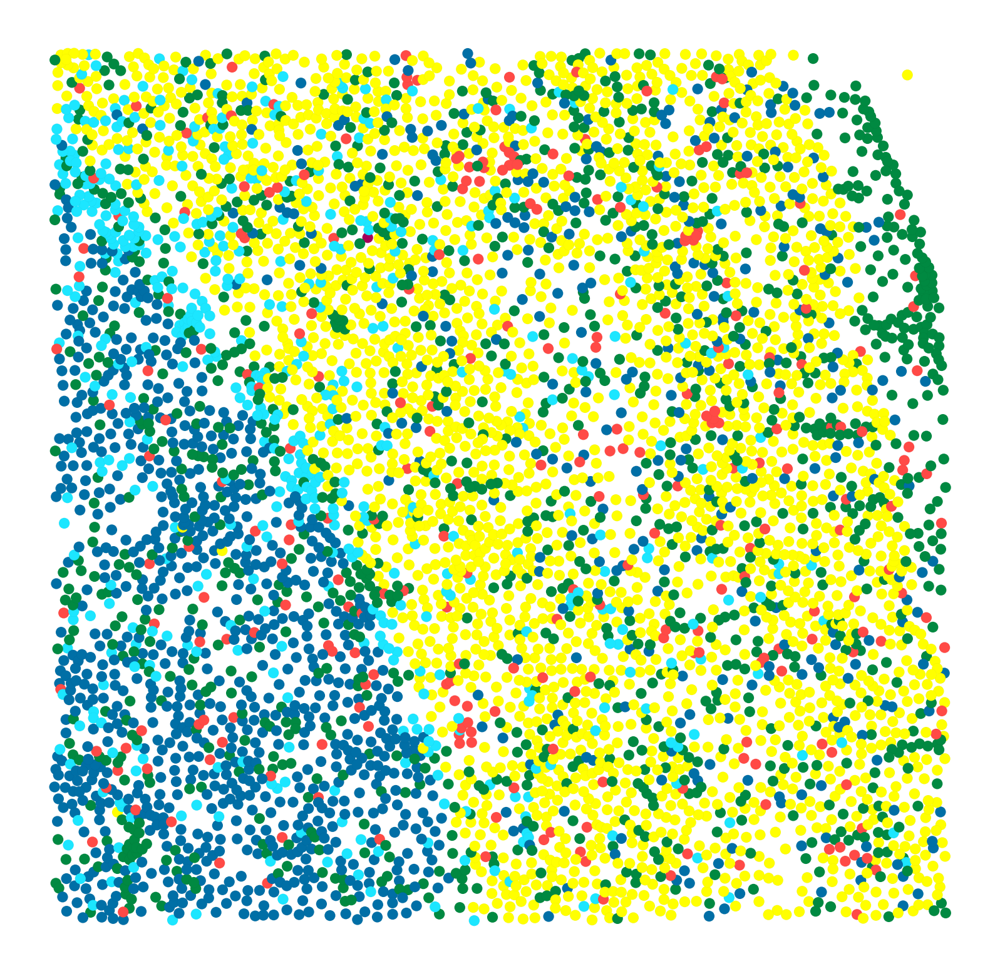

In [25]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=60,
    c=zdata.obs['celltype_colors'],
)
plt.axis('off')
filename = os.path.join(figpath, f'celltypes_zoom.png')
plt.savefig(filename, dpi=dpi)
plt.show()